In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

csv_file_path = '/content/gdrive/MyDrive/nih-chest-xrays/expanded_file.csv'

df = pd.read_csv(csv_file_path)

# Split the data into training (75%) and temp (25%) sets
train_df, temp_df = train_test_split(df, test_size=0.25, random_state=42)

# Split the temp data equally into validation (50% of temp) and test (50% of temp) sets
valid_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42)

print(f'Training set: {len(train_df)} rows')
print(f'Validation set: {len(valid_df)} rows')
print(f'Test set: {len(test_df)} rows')

train_df.to_csv('/content/gdrive/MyDrive/nih-chest-xrays/train.csv', index=False)
valid_df.to_csv('/content/gdrive/MyDrive/nih-chest-xrays/valid.csv', index=False)
test_df.to_csv('/content/gdrive/MyDrive/nih-chest-xrays/test.csv', index=False)

print('CSV files have been created successfully.')


Training set: 38819 rows
Validation set: 6470 rows
Test set: 6470 rows
CSV files have been created successfully.


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.models import load_model


In [ ]:
labels = ['Cardiomegaly',
          'Emphysema',
          'Effusion',
          'Hernia',
          'Infiltration',
          'Mass',
          'Nodule',
          'Atelectasis',
          'Pneumothorax',
          'Pleural_Thickening',
          'Pneumonia',
          'Fibrosis',
          'Edema',
          'Consolidation']

In [ ]:
train_df = pd.read_csv('/content/gdrive/MyDrive/nih-chest-xrays/train.csv')
valid_df = pd.read_csv('/content/gdrive/MyDrive/nih-chest-xrays/valid.csv')

test_df = pd.read_csv('/content/gdrive/MyDrive/nih-chest-xrays/test.csv')

train_df.head()

,Image Index,Patient ID,Cardiomegaly,Emphysema,Effusion,Hernia,Infiltration,Mass,Nodule,Atelectasis,Pneumothorax,Pleural_Thickening,Pneumonia,Fibrosis,Edema,Consolidation
0,00019996_000.png,19996,0,0,0,0,1,0,1,0,0,0,0,0,0,0
1,00014879_004.png,14879,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,00028552_002.png,28552,0,0,0,0,1,0,0,0,0,0,0,0,1,0
3,00009825_001.png,9825,0,0,0,0,1,0,0,0,0,0,0,0,0,0
4,00019129_000.png,19129,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [ ]:
import pandas as pd
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def get_train_generator(df, image_dir, x_col, y_cols, shuffle=True, batch_size=32, seed=1, target_w=320, target_h=320):
    print("Getting train generator...")
    image_generator = ImageDataGenerator(samplewise_center=True, samplewise_std_normalization=True)
    generator = image_generator.flow_from_dataframe(
        dataframe=df,
        directory=image_dir,
        x_col=x_col,
        y_col=y_cols,
        class_mode="raw",
        batch_size=batch_size,
        shuffle=shuffle,
        seed=seed,
        target_size=(target_w, target_h)
    )
    return generator

def get_test_and_valid_generator(valid_df, test_df, train_df, image_dir, x_col, y_cols, sample_size=100, batch_size=32, seed=1, target_w=320, target_h=320):
    print("Getting test and valid generators...")
    raw_train_generator = ImageDataGenerator().flow_from_dataframe(
        dataframe=train_df,
        directory=image_dir,
        x_col="Image Index",
        y_col=y_cols,
        class_mode="raw",
        batch_size=sample_size,
        shuffle=True,
        target_size=(target_w, target_h)
    )
    batch = next(raw_train_generator)
    data_sample = batch[0]
    image_generator = ImageDataGenerator(featurewise_center=True, featurewise_std_normalization=True)
    image_generator.fit(data_sample)
    valid_generator = image_generator.flow_from_dataframe(
        dataframe=valid_df,
        directory=image_dir,
        x_col=x_col,
        y_col=y_cols,
        class_mode="raw",
        batch_size=batch_size,
        shuffle=False,
        seed=seed,
        target_size=(target_w, target_h)
    )
    test_generator = image_generator.flow_from_dataframe(
        dataframe=test_df,
        directory=image_dir,
        x_col=x_col,
        y_col=y_cols,
        class_mode="raw",
        batch_size=batch_size,
        shuffle=False,
        seed=seed,
        target_size=(target_w, target_h)
    )
    return valid_generator, test_generator

In [ ]:
IMAGE_DIR = "/content/gdrive/MyDrive/new"
x_col = 'Image Index'
train_generator = get_train_generator(train_df, IMAGE_DIR, x_col, labels)
valid_generator, test_generator = get_test_and_valid_generator(valid_df, test_df, train_df, IMAGE_DIR, 'Image Index', labels)

Getting train generator...
Found 38819 validated image filenames.
Getting test and valid generators...
Found 38819 validated image filenames.
Found 6470 validated image filenames.
Found 6470 validated image filenames.


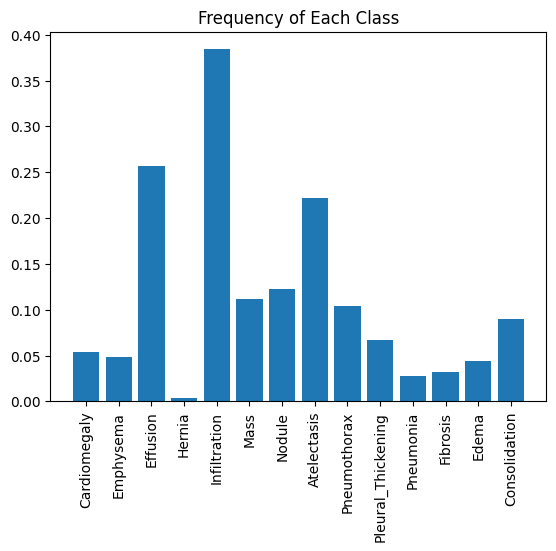

In [ ]:
plt.xticks(rotation=90)
plt.bar(x=labels, height=np.mean(train_generator.labels, axis=0))
plt.title("Frequency of Each Class")
plt.show()

In [ ]:
def compute_class_freqs(labels):

    # total number of patients (rows)
    N = labels.shape[0]

    positive_frequencies = np.sum(labels, axis=0) / N
    negative_frequencies = 1 - positive_frequencies

    return positive_frequencies, negative_frequencies

In [ ]:
freq_pos, freq_neg = compute_class_freqs(train_generator.labels)
freq_pos

array([0.05386538, 0.04812077, 0.25667843, 0.00419897, 0.3840645 ,
       0.11167212, 0.12238852, 0.22213349, 0.10368634, 0.06679719,
       0.02735774, 0.03248409, 0.04441124, 0.08954378])

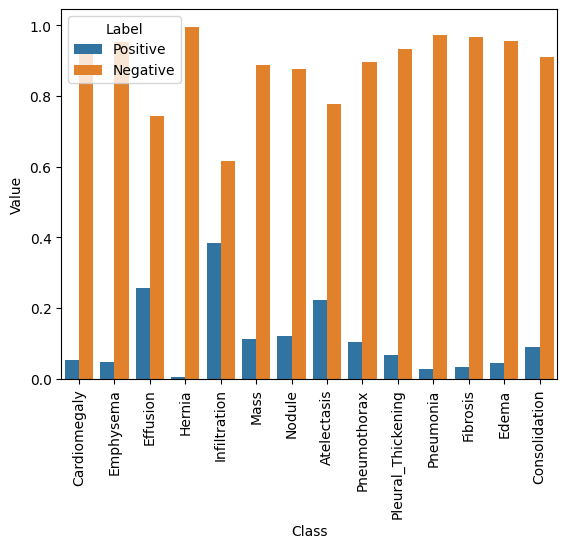

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

data = pd.DataFrame({"Class": labels, "Label": "Positive", "Value": freq_pos})

additional_data = pd.DataFrame([{"Class": labels[l], "Label": "Negative", "Value": v} for l, v in enumerate(freq_neg)])

data = pd.concat([data, additional_data], ignore_index=True)

plt.xticks(rotation=90)
f = sns.barplot(x="Class", y="Value", hue="Label", data=data)
plt.show()


In [ ]:
pos_weights = freq_neg
neg_weights = freq_pos
pos_contribution = freq_pos * pos_weights
neg_contribution = freq_neg * neg_weights

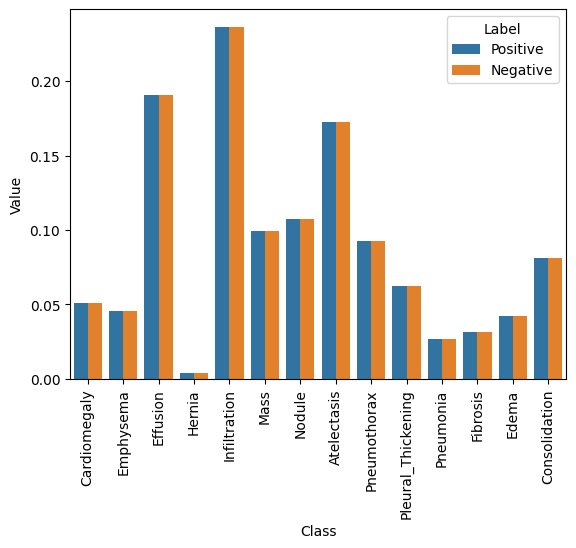

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

data = pd.DataFrame({"Class": labels, "Label": "Positive", "Value": pos_contribution})

# Create a DataFrame from a list of dictionaries for negative values
additional_data = pd.DataFrame([{"Class": labels[l], "Label": "Negative", "Value": v}
                                for l, v in enumerate(neg_contribution)])

data = pd.concat([data, additional_data], ignore_index=True)

# Visualization
plt.xticks(rotation=90)
sns.barplot(x="Class", y="Value", hue="Label", data=data)
plt.show()


In [ ]:

def get_weighted_loss(pos_weights, neg_weights, epsilon=1e-7):

    def weighted_loss(y_true, y_pred):

        loss = 0.0

        for i in range(len(pos_weights)):
            # for each class, add average weighted loss for that class
            loss_pos = -1 * K.mean(pos_weights[i] * y_true[:, i] * K.log(y_pred[:, i] + epsilon))
            loss_neg = -1 * K.mean(neg_weights[i] * (1 - y_true[:, i]) * K.log(1 - y_pred[:, i] + epsilon))
            loss += loss_pos + loss_neg

        return loss


    return weighted_loss

In [ ]:
# create the base pre-trained model
base_model = DenseNet121(weights='/content/gdrive/MyDrive/nih-chest-xrays/densenet.hdf5', include_top=False)

x = base_model.output

# add a global spatial average pooling layer
x = GlobalAveragePooling2D()(x)

# and a logistic layer
predictions = Dense(len(labels), activation="sigmoid")(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer='adam', loss=get_weighted_loss(pos_weights, neg_weights))

In [ ]:
model.load_weights("/content/gdrive/MyDrive/nih-chest-xrays/trail_rapid.h5")

In [ ]:
predicted_vals = model.predict(test_generator, steps = len(test_generator))

203/203 [==============================] - 2763s 14s/step


In [ ]:
import random

import cv2
import matplotlib.pyplot as plt
import numpy as np
from keras import backend as K
from keras.preprocessing import image
from sklearn.metrics import roc_auc_score, roc_curve
from tensorflow.compat.v1.logging import INFO, set_verbosity

random.seed(a=None, version=2)

set_verbosity(INFO)



def get_roc_curve(labels, predicted_vals, generator):
    auc_roc_vals = []
    for i in range(len(labels)):
        try:
            gt = generator.labels[:, i]
            pred = predicted_vals[:, i]
            auc_roc = roc_auc_score(gt, pred)
            auc_roc_vals.append(auc_roc)
            fpr_rf, tpr_rf, _ = roc_curve(gt, pred)
            plt.figure(1, figsize=(10, 10))
            plt.plot([0, 1], [0, 1], 'k--')
            plt.plot(fpr_rf, tpr_rf,
                     label=labels[i] + " (" + str(round(auc_roc, 3)) + ")")
            plt.xlabel('False positive rate')
            plt.ylabel('True positive rate')
            plt.title('ROC curve')
            plt.legend(loc='best')
        except:
            print(
                f"Error in generating ROC curve for {labels[i]}. "
                f"Dataset lacks enough examples."
            )
    plt.show()
    return auc_roc_vals

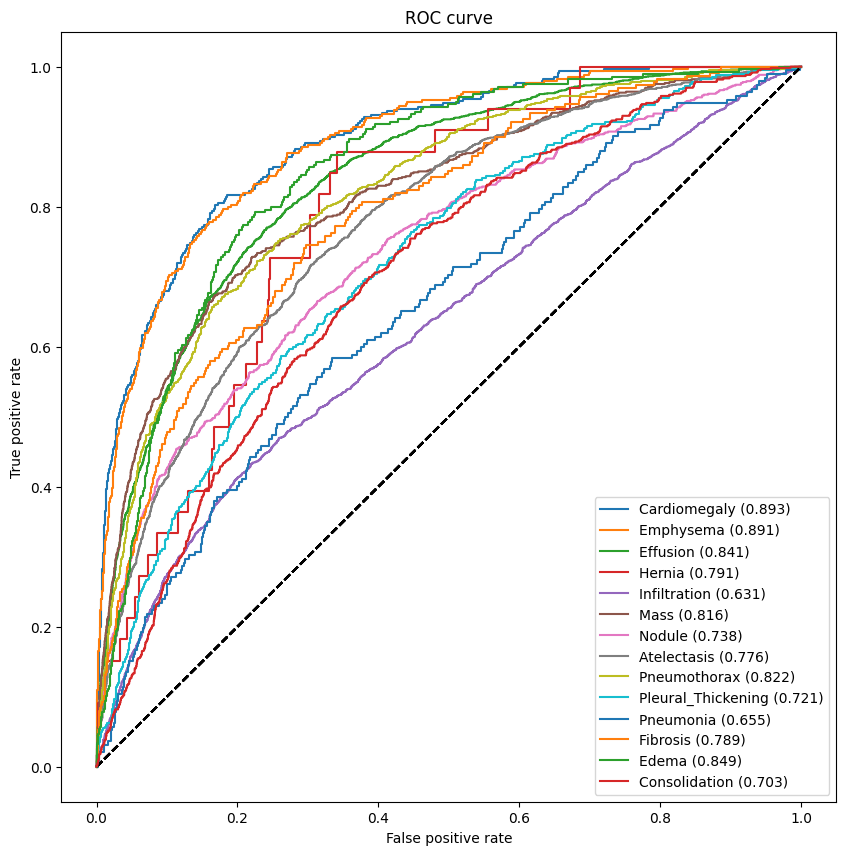

In [ ]:
auc_rocs = get_roc_curve(labels, predicted_vals, test_generator)

In [ ]:
import random
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import numpy as np
from keras import backend as K
from keras.preprocessing import image
from sklearn.metrics import roc_auc_score, roc_curve
from tensorflow.compat.v1.logging import INFO, set_verbosity

random.seed(a=None, version=2)

set_verbosity(INFO)

import tensorflow as tf

def get_mean_std_per_batch(image_path, df, H=320, W=320):
    sample_data = []
    for img in df["Image Index"].values:
        full_img_path = os.path.join(image_path, img)
        if os.path.exists(full_img_path):
            sample_data.append(
                np.array(image.load_img(full_img_path, target_size=(H, W)))
            )
        if len(sample_data) >= 100:
            break

    if not sample_data:
        raise ValueError("No valid images found in the directory.")

    mean = np.mean(sample_data[0])
    std = np.std(sample_data[0])
    return mean, std


def load_image(img, image_dir, df, preprocess=True, H=320, W=320):
    """Load and preprocess image."""
    img_path = os.path.join(image_dir, img)
    mean, std = get_mean_std_per_batch(image_dir, df, H=H, W=W)
    x = image.img_to_array(image.load_img(img_path, target_size=(H, W)))
    if preprocess:
        x -= mean
        x /= std
        x = np.expand_dims(x, axis=0)
    return x


def grad_cam(input_model, image, cls, layer_name, H=320, W=320):
    """GradCAM method for visualizing input saliency."""
    grad_model = tf.keras.models.Model(
        [input_model.inputs], [input_model.get_layer(layer_name).output, input_model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(image)
        loss = predictions[:, cls]

    grads = tape.gradient(loss, conv_outputs)[0]
    output = conv_outputs[0]
    weights = tf.reduce_mean(grads, axis=(0, 1))

    cam = np.dot(output, weights.numpy())

    # Process CAM
    cam = cv2.resize(cam, (W, H), cv2.INTER_LINEAR)
    cam = np.maximum(cam, 0)
    cam = cam / cam.max()
    return cam


def compute_gradcam(model, img, image_dir, df, labels, selected_labels, layer_name='bn'):
    preprocessed_input = load_image(img, image_dir, df)
    predictions = model.predict(preprocessed_input)

    print("Loading original image")
    plt.figure(figsize=(15, 15))

    num_plots = len(selected_labels) + 1
    rows = 4
    cols = 4
    plt.subplot(rows, cols, 1)
    plt.title("Original")
    plt.axis('off')
    plt.imshow(load_image(img, image_dir, df, preprocess=False).astype(np.uint8), cmap='gray')

    j = 1
    for i in range(len(labels)):
        if labels[i] in selected_labels:
            print(f"Generating gradcam for class {labels[i]}")
            gradcam = grad_cam(model, preprocessed_input, i, layer_name)
            plt.subplot(rows, cols, j + 1)
            plt.title(f"{labels[i]}: p={predictions[0][i]:.3f}")
            plt.axis('off')
            plt.imshow(load_image(img, image_dir, df, preprocess=False).astype(np.uint8),
                       cmap='gray')
            plt.imshow(gradcam, cmap='jet', alpha=min(0.5, predictions[0][i]))
            j += 1
            if j >= rows * cols - 1:
                break
    plt.tight_layout()
    plt.show()
    return predictions


def get_highest_prob_disease_with_heatmap(model, img, image_dir, df, labels, threshold=0.5, layer_name='bn'):
    """
    Get the disease with the highest probability and save the Grad-CAM image for that disease.
    If no disease has a probability greater than the threshold, return "No Findings".
    """
    preprocessed_input = load_image(img, image_dir, df)
    predictions = model.predict(preprocessed_input)

    max_prob = np.max(predictions)
    if max_prob > threshold:
        max_index = np.argmax(predictions)
        disease = labels[max_index]
        result = f"Disease: {disease}, Probability: {max_prob:.3f}"

        print(result)

        print(f"Generating Grad-CAM for class {disease}")
        gradcam = grad_cam(model, preprocessed_input, max_index, layer_name)

        plt.figure(figsize=(10, 10))
        plt.title(f"{disease}: p={predictions[0][max_index]:.3f}")
        plt.axis('off')
        plt.imshow(load_image(img, image_dir, df, preprocess=False).astype(np.uint8), cmap='gray')
        plt.imshow(gradcam, cmap='jet', alpha=0.5)

        # Save the heatmap image
        heatmap_path = f"gradcam_{disease}.png"
        plt.savefig(heatmap_path)
        plt.tight_layout()
        plt.show()

        return result, heatmap_path
    else:
        result = "No Findings"
        print(result)
        return result, None


# Example usage
labels1 = ['Cardiomegaly', 'Effusion', 'Infiltration', 'Mass', 'Nodule', 'Atelectasis', 'Pneumothorax', 'Pneumonia']
df = pd.read_csv("/content/gdrive/MyDrive/nih-chest-xrays/expanded_file.csv")
IMAGE_DIR = "/content/gdrive/MyDrive/new"
# result, heatmap_path = get_highest_prob_disease_with_heatmap(model, '00000011_000.png', IMAGE_DIR, df, labels1)
# print(result)
# if heatmap_path:
#     print(f"Heatmap saved to: {heatmap_path}")


1/1 [==============================] - 3s 3s/step
Loading original image
Generating gradcam for class Cardiomegaly
Generating gradcam for class Emphysema
Generating gradcam for class Effusion
Generating gradcam for class Hernia
Generating gradcam for class Infiltration
Generating gradcam for class Mass
Generating gradcam for class Nodule
Generating gradcam for class Atelectasis
Generating gradcam for class Pneumothorax
Generating gradcam for class Pleural_Thickening
Generating gradcam for class Pneumonia
Generating gradcam for class Fibrosis
Generating gradcam for class Edema
Generating gradcam for class Consolidation


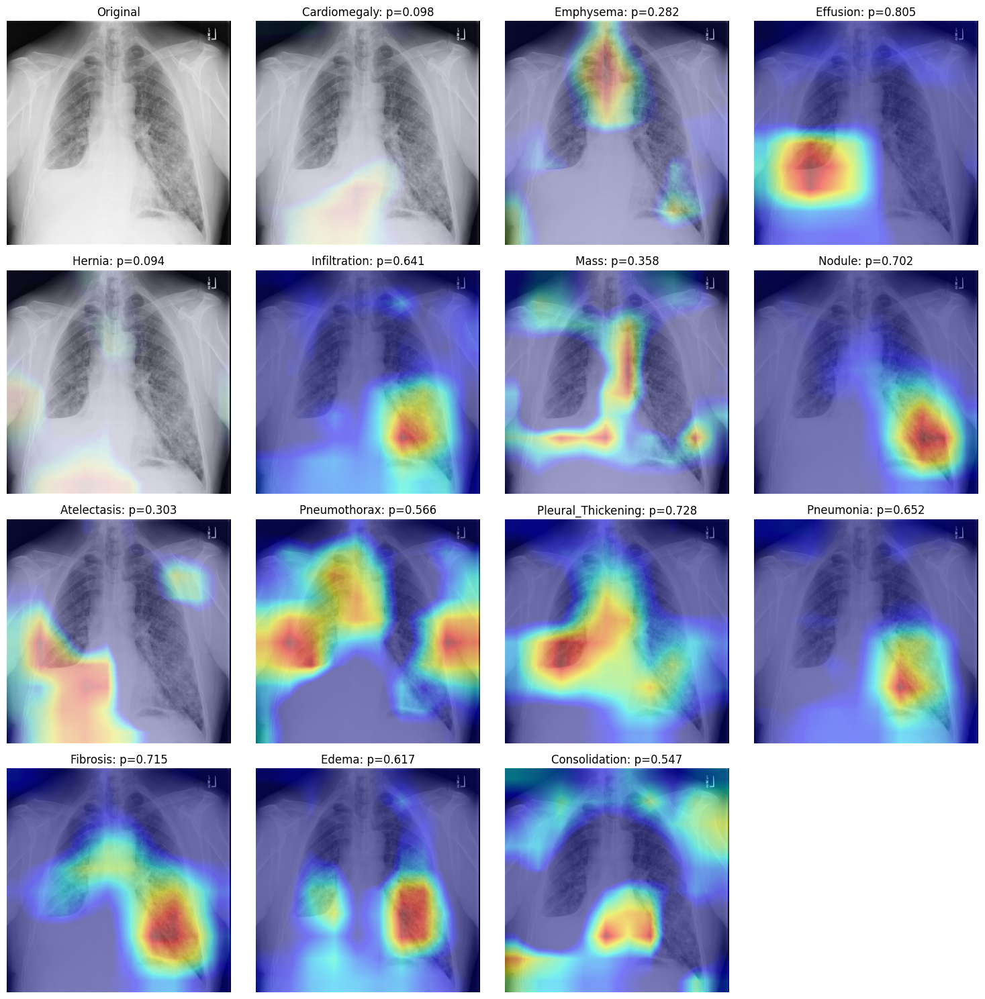

array([[0.09794363, 0.28223452, 0.80464786, 0.09356681, 0.64083433,
        0.3580002 , 0.7019358 , 0.30271062, 0.56585574, 0.727827  ,
        0.6522308 , 0.71512806, 0.61672634, 0.5470711 ]], dtype=float32)

In [ ]:
compute_gradcam(model, '00007882_001.png', IMAGE_DIR, df, labels, labels)

1/1 [==============================] - 0s 297ms/step
Disease: Effusion, Probability: 0.805
Generating Grad-CAM for class Effusion


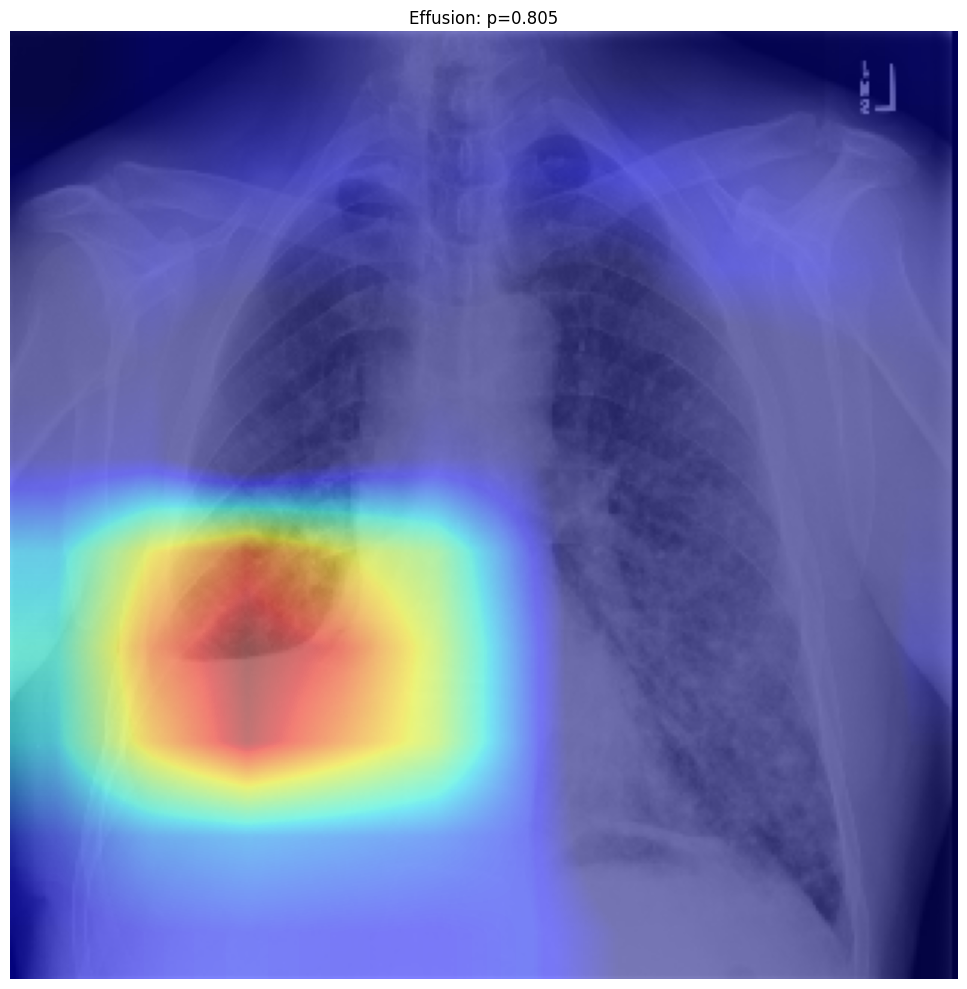

Disease: Effusion, Probability: 0.805
Heatmap saved to: gradcam_Effusion.png


In [ ]:
result, heatmap_path = get_highest_prob_disease_with_heatmap(model, '00007882_001.png', IMAGE_DIR, df, labels)
print(result)
if heatmap_path:
    print(f"Heatmap saved to: {heatmap_path}")

WhatsApp Image 2024-07-21 at 16.09.50_b2537e18.jpg
WhatsApp Image 2024-07-21 at 16.09.49_886428ab.jpg

1/1 [==============================] - 0s 324ms/step
Loading original image
Generating gradcam for class Cardiomegaly
Generating gradcam for class Emphysema
Generating gradcam for class Effusion
Generating gradcam for class Hernia
Generating gradcam for class Infiltration
Generating gradcam for class Mass
Generating gradcam for class Nodule
Generating gradcam for class Atelectasis
Generating gradcam for class Pneumothorax
Generating gradcam for class Pleural_Thickening
Generating gradcam for class Pneumonia
Generating gradcam for class Fibrosis
Generating gradcam for class Edema
Generating gradcam for class Consolidation


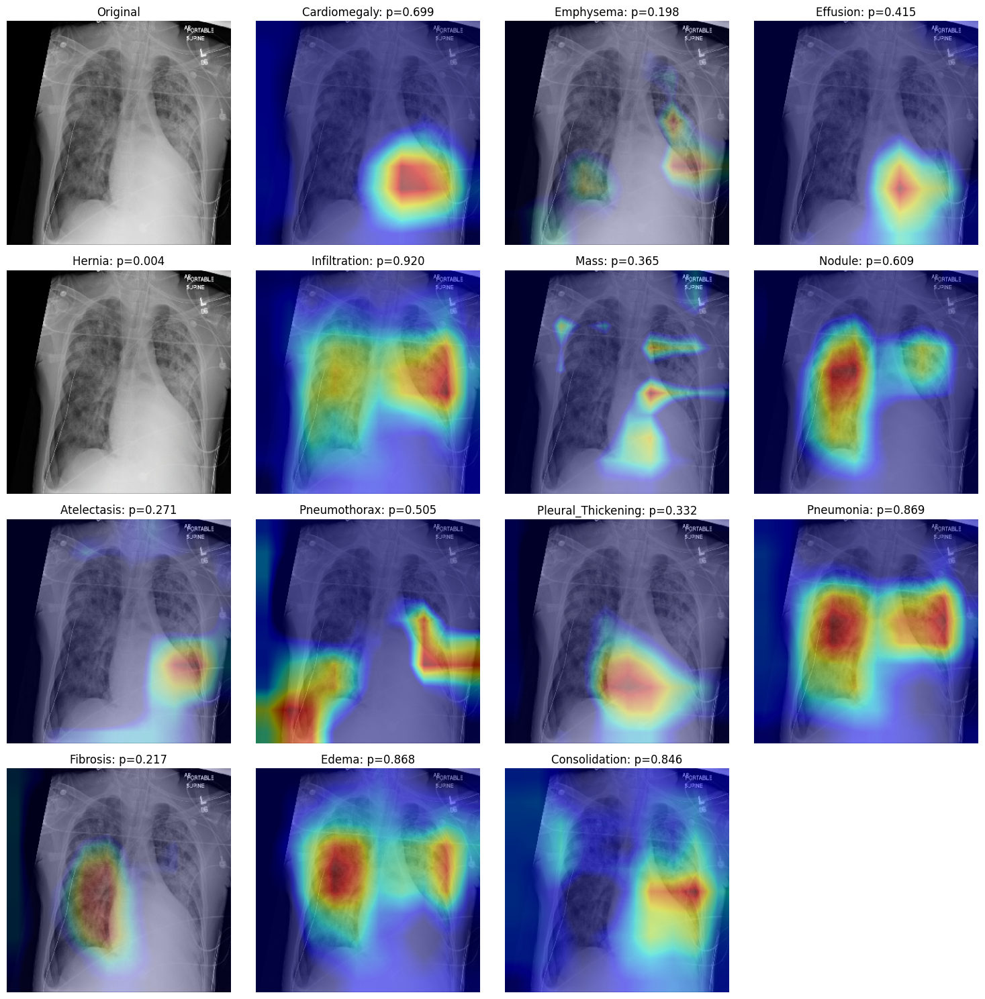

array([[0.6991576 , 0.19809651, 0.41480547, 0.00425507, 0.9195264 ,
        0.3646814 , 0.6086369 , 0.27110973, 0.5050734 , 0.33211297,
        0.8691568 , 0.21695983, 0.86754936, 0.84643036]], dtype=float32)

In [ ]:
compute_gradcam(model, '00004342_050.png', IMAGE_DIR, df, labels, labels)

1/1 [==============================] - 0s 329ms/step
Disease: Infiltration, Probability: 0.920
Generating Grad-CAM for class Infiltration


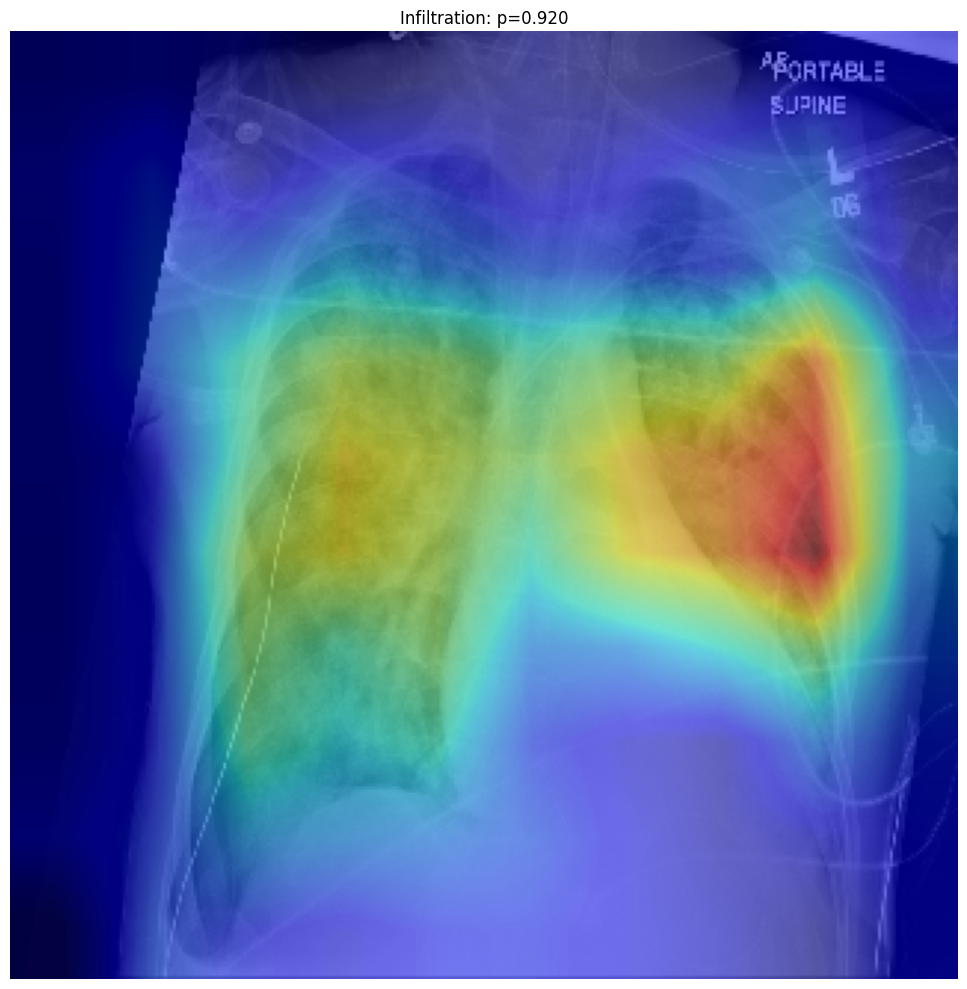

Disease: Infiltration, Probability: 0.920
Heatmap saved to: gradcam_Infiltration.png


In [ ]:
result, heatmap_path = get_highest_prob_disease_with_heatmap(model, '00004342_050.png', IMAGE_DIR, df, labels)
print(result)
if heatmap_path:
    print(f"Heatmap saved to: {heatmap_path}")

WhatsApp Image 2024-07-21 at 16.09.49_be54990d.jpg
WhatsApp Image 2024-07-21 at 16.09.49_6014d272.jpg

1/1 [==============================] - 0s 350ms/step
Loading original image
Generating gradcam for class Cardiomegaly
Generating gradcam for class Emphysema
Generating gradcam for class Effusion
Generating gradcam for class Hernia
Generating gradcam for class Infiltration
Generating gradcam for class Mass
Generating gradcam for class Nodule
Generating gradcam for class Atelectasis
Generating gradcam for class Pneumothorax
Generating gradcam for class Pleural_Thickening
Generating gradcam for class Pneumonia
Generating gradcam for class Fibrosis
Generating gradcam for class Edema
Generating gradcam for class Consolidation


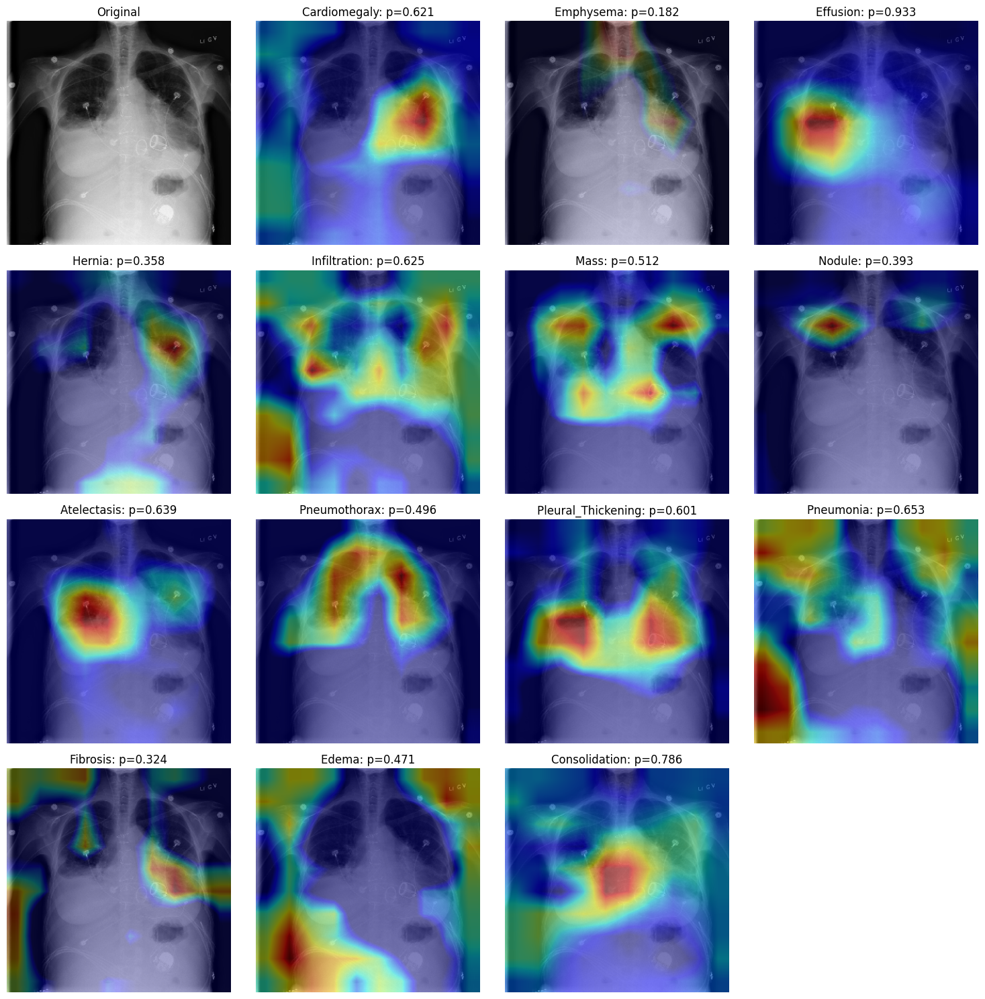

array([[0.62148696, 0.18165419, 0.9326777 , 0.35756338, 0.6251331 ,
        0.5124647 , 0.39324647, 0.6388964 , 0.49622276, 0.6005486 ,
        0.65307623, 0.32388285, 0.47069642, 0.785536  ]], dtype=float32)

In [ ]:
compute_gradcam(model, '00000096_002.png', IMAGE_DIR, df, labels, labels)

1/1 [==============================] - 0s 308ms/step
Disease: Effusion, Probability: 0.933
Generating Grad-CAM for class Effusion


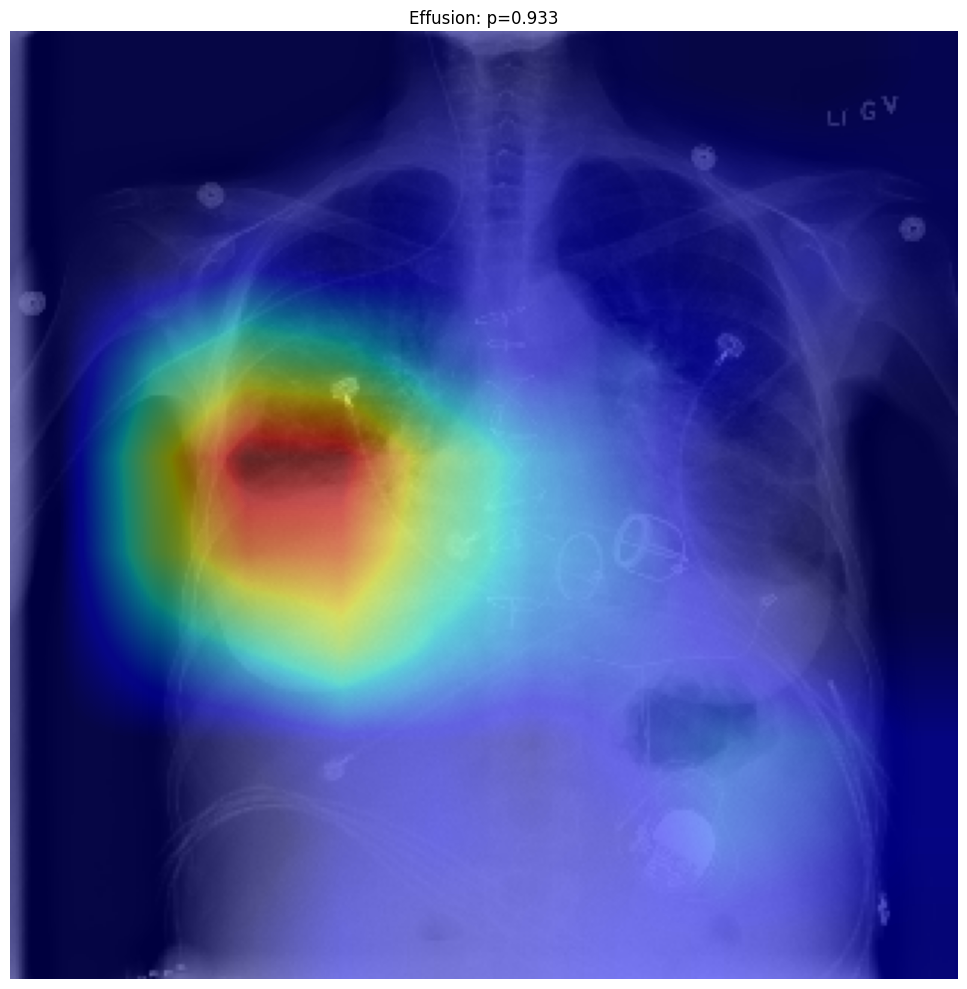

Disease: Effusion, Probability: 0.933
Heatmap saved to: gradcam_Effusion.png


In [ ]:
result, heatmap_path = get_highest_prob_disease_with_heatmap(model, '00000096_002.png', IMAGE_DIR, df, labels)
print(result)
if heatmap_path:
    print(f"Heatmap saved to: {heatmap_path}")

WhatsApp Image 2024-07-21 at 21.00.02_272053bb.jpg

1/1 [==============================] - 0s 321ms/step
Loading original image
Generating gradcam for class Cardiomegaly
Generating gradcam for class Emphysema
Generating gradcam for class Effusion
Generating gradcam for class Hernia
Generating gradcam for class Infiltration
Generating gradcam for class Mass
Generating gradcam for class Nodule
Generating gradcam for class Atelectasis
Generating gradcam for class Pneumothorax
Generating gradcam for class Pleural_Thickening
Generating gradcam for class Pneumonia
Generating gradcam for class Fibrosis
Generating gradcam for class Edema
Generating gradcam for class Consolidation


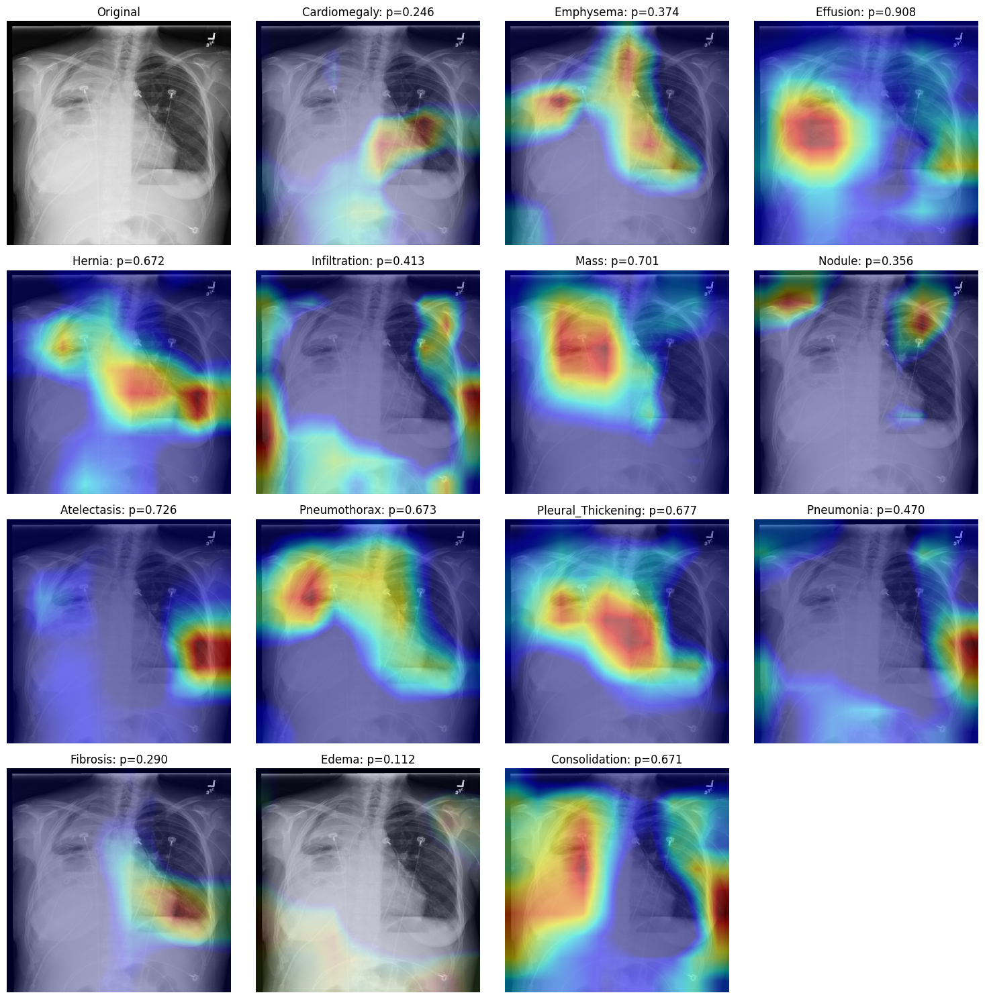

array([[0.24610251, 0.37411523, 0.9076028 , 0.67242926, 0.4126516 ,
        0.7014464 , 0.35602686, 0.7255257 , 0.67322356, 0.67729235,
        0.47048795, 0.28983134, 0.11223774, 0.67084104]], dtype=float32)

In [ ]:
compute_gradcam(model, '00001437_012.png', IMAGE_DIR, df, labels, labels)

1/1 [==============================] - 0s 306ms/step
Disease: Effusion, Probability: 0.908
Generating Grad-CAM for class Effusion


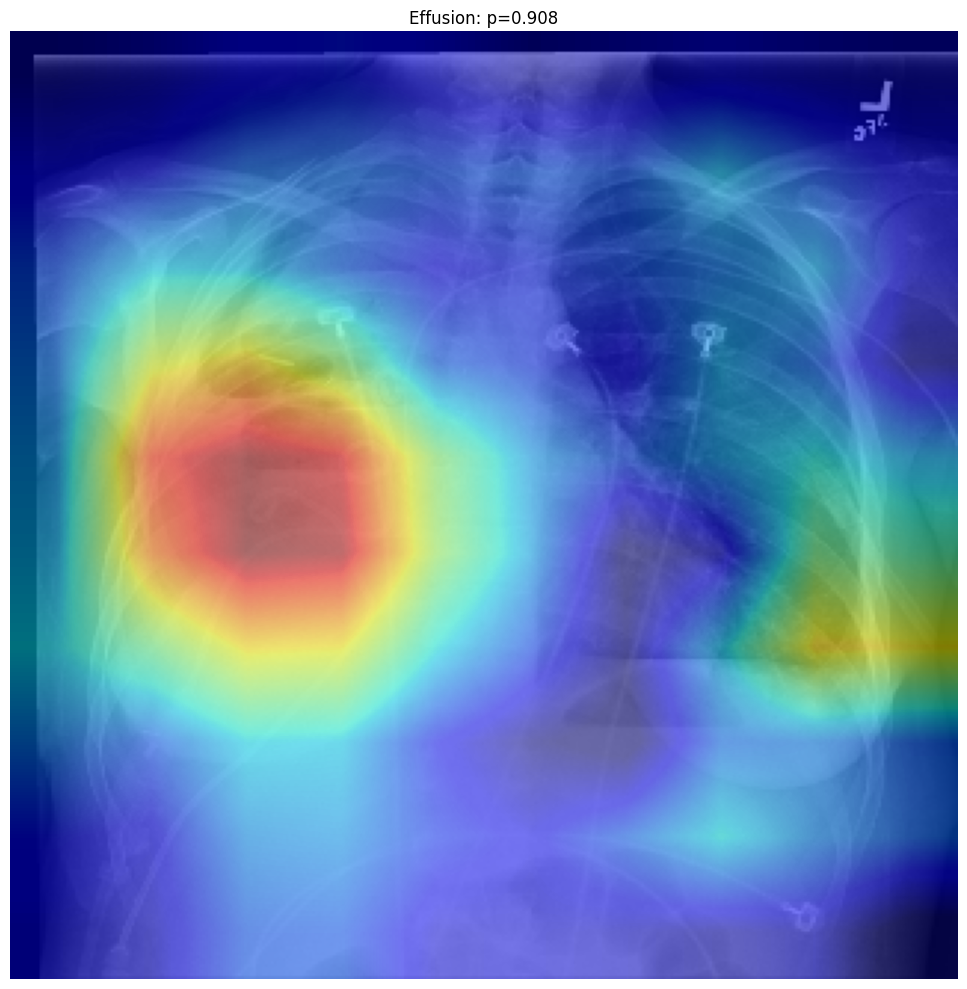

Disease: Effusion, Probability: 0.908
Heatmap saved to: gradcam_Effusion.png


In [ ]:
result, heatmap_path = get_highest_prob_disease_with_heatmap(model, '00001437_012.png', IMAGE_DIR, df, labels)
print(result)
if heatmap_path:
    print(f"Heatmap saved to: {heatmap_path}")

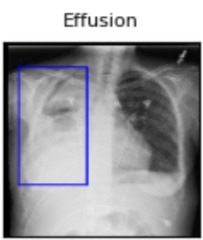

1/1 [==============================] - 0s 310ms/step
Loading original image
Generating gradcam for class Cardiomegaly
Generating gradcam for class Emphysema
Generating gradcam for class Effusion
Generating gradcam for class Hernia
Generating gradcam for class Infiltration
Generating gradcam for class Mass
Generating gradcam for class Nodule
Generating gradcam for class Atelectasis
Generating gradcam for class Pneumothorax
Generating gradcam for class Pleural_Thickening
Generating gradcam for class Pneumonia
Generating gradcam for class Fibrosis
Generating gradcam for class Edema
Generating gradcam for class Consolidation


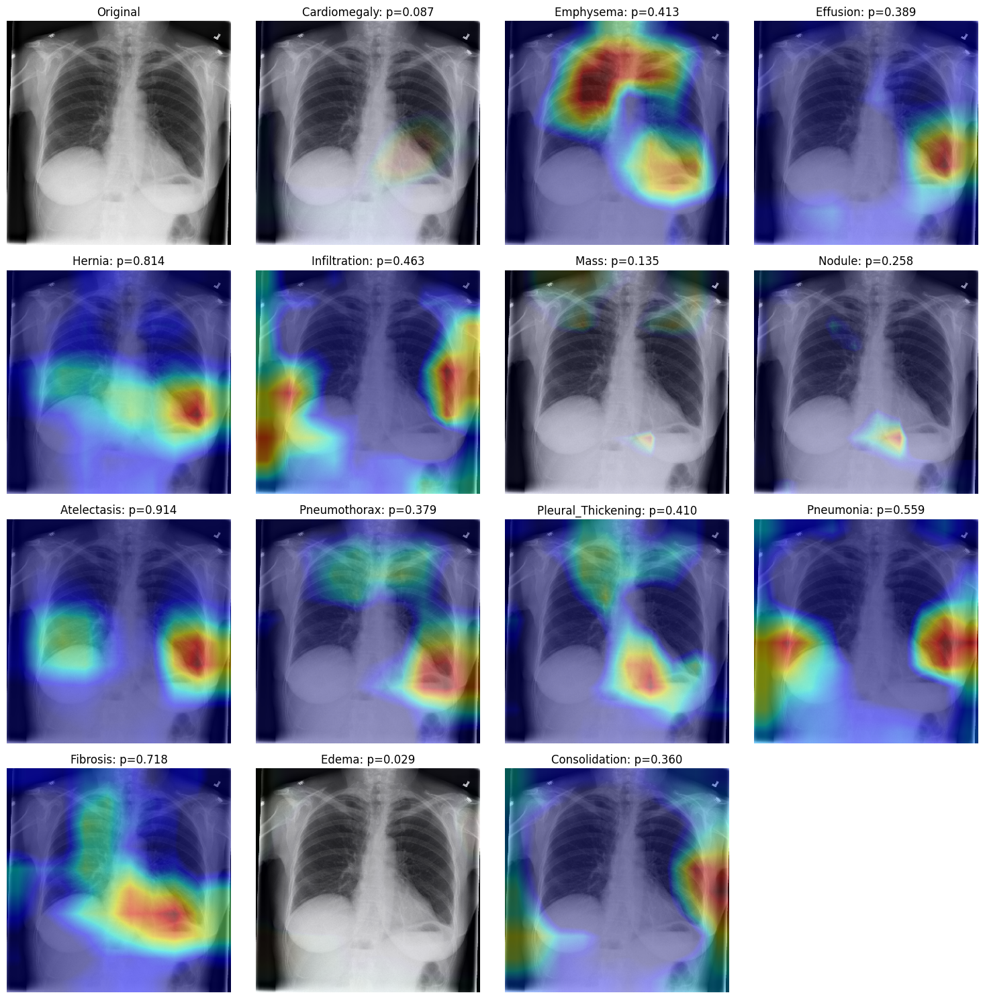

array([[0.0872203 , 0.41287842, 0.38907474, 0.8137952 , 0.46264696,
        0.13495237, 0.25760177, 0.91442835, 0.37852454, 0.40977082,
        0.5594    , 0.71814054, 0.02855798, 0.35964087]], dtype=float32)

In [ ]:
compute_gradcam(model, '00000147_001.png', IMAGE_DIR, df, labels, labels)

1/1 [==============================] - 0s 343ms/step
Disease: Atelectasis, Probability: 0.914
Generating Grad-CAM for class Atelectasis


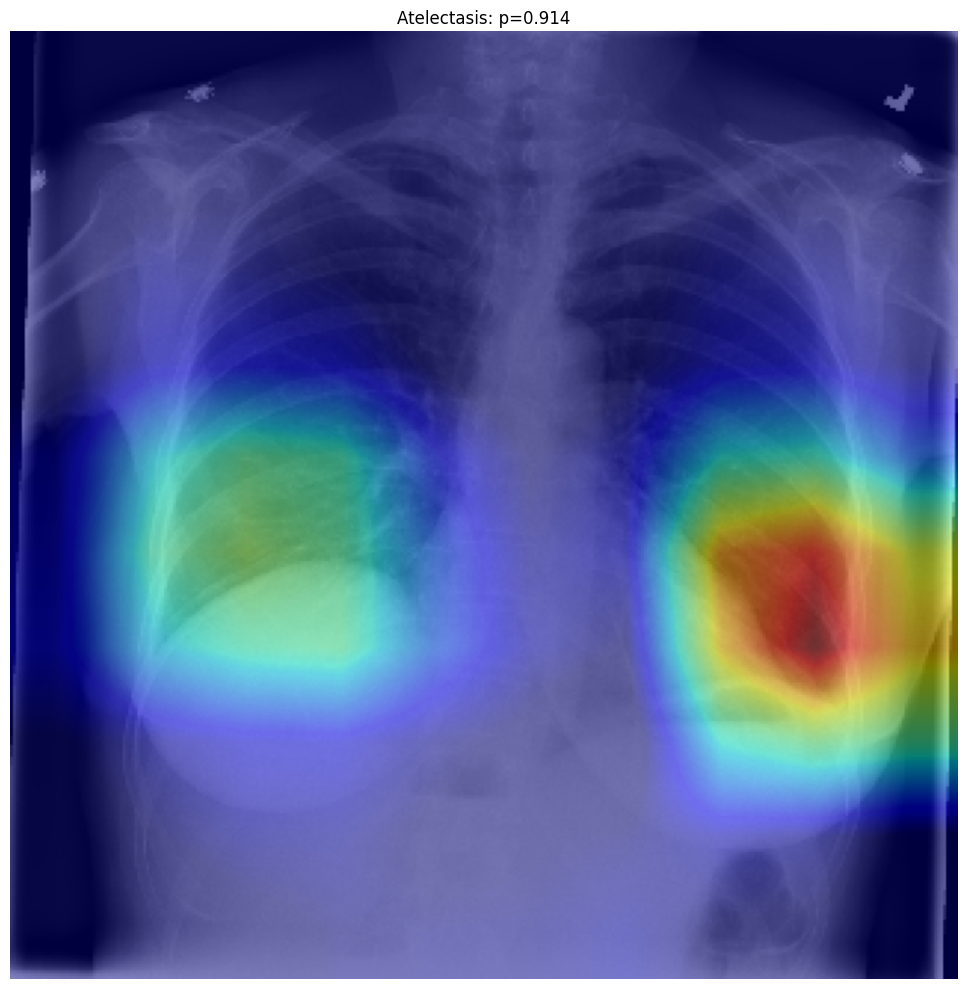

Disease: Atelectasis, Probability: 0.914
Heatmap saved to: gradcam_Atelectasis.png


In [ ]:
result, heatmap_path = get_highest_prob_disease_with_heatmap(model, '00000147_001.png', IMAGE_DIR, df, labels)
print(result)
if heatmap_path:
    print(f"Heatmap saved to: {heatmap_path}")

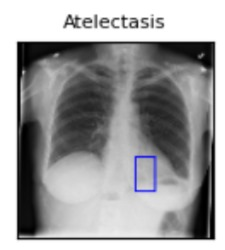